In [1]:
from collections import defaultdict

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
import scipy.linalg.interpolative as sli
from sklearn.neighbors import KNeighborsRegressor
import scipy.stats as stats

# Global variables
N = 100  # Number of different points sampled
pressure_noise_magnitude = 0.0
gen = np.random.default_rng()

# 1. Synthetic data generation

In this section we define some functions to generate synthetic data which resembles the PSAAP problem. We assume that there is an underlying latent function which describes the probability of ignition, and observing ignition is like observing a Bernoulli distributed random variable, with p equal to the latent. We also come up with a simple model which generates sigmoidal pressure traces from the 2D parameter space.

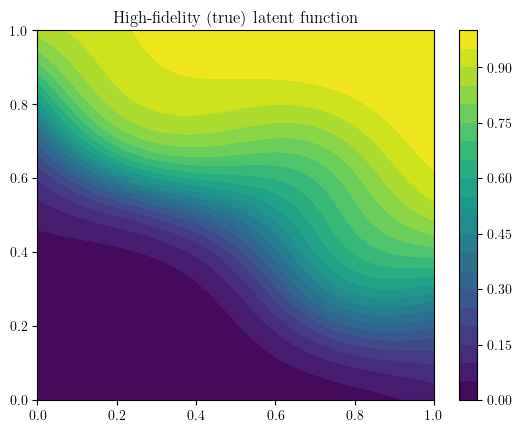

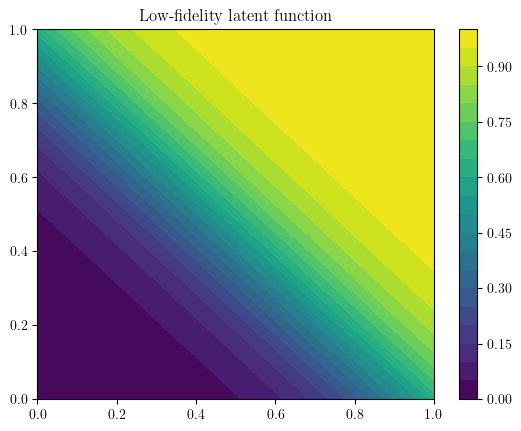

In [2]:

def high_fidelity_latent_function(x):
    assert x.shape[-1] == 2

    # Define a hyperplane with normal vector [1, 1] and offset sqrt(2)
    n_hat = np.array([1, 2]) / np.sqrt(5)
    offset = np.sqrt(2) / 2

    f = np.dot(n_hat, x) - offset

    # Add a sinusoidal perturbation
    f -= 0.1 * np.sin(2 * np.pi * x[0]) * np.sin(2 * np.pi * x[1])
    
    f = 1 / (1 + np.exp(-10 * f))

    return f


def low_fidelity_latent_function(x):
    assert x.shape[-1] == 2

    # Define a hyperplane with normal vector [1, 1] and offset sqrt(2)
    n_hat = np.array([1, 1]) / np.sqrt(2)
    offset = np.sqrt(2) / 2 - 0.05  # Overall, the LF is more likely to ignite, so f is larger

    f = np.dot(n_hat, x) - offset
    
    f = 1 / (1 + np.exp(-10 * f))

    return f


def visualise_latent_functions(f, title):
    # Contour plot of latent
    x = np.linspace(0, 1, 100)
    y = np.linspace(0, 1, 100)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = f(np.array([X[i, j], Y[i, j]]))

    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.contourf(X, Y, Z, 20)

    # Add line at f=0 contour
    ax.contour(X, Y, Z, levels=[0], colors='black')

    fig.colorbar(im)
    ax.set_title(title)
    plt.show()

visualise_latent_functions(high_fidelity_latent_function, 'High-fidelity (true) latent function')
visualise_latent_functions(low_fidelity_latent_function, 'Low-fidelity latent function')


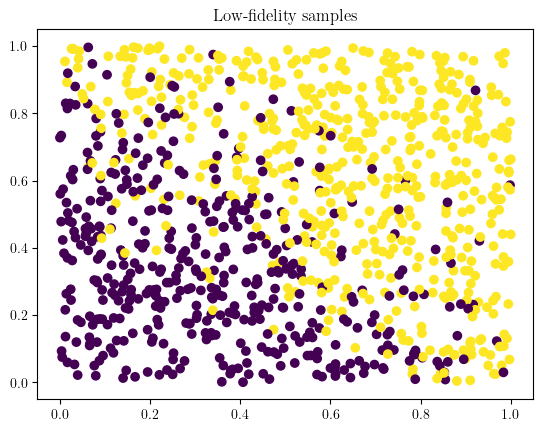

In [3]:
def sample_bernoulli_outcome(x: np.ndarray) -> np.ndarray:
    return np.random.binomial(1, high_fidelity_latent_function(x))

def sample_bernoulli_outcome_low_fidelity() -> np.ndarray:
    xs = np.random.uniform(0, 1, size=(1000, 2))
    outcomes = []
    
    for x in xs:
        outcomes.append(np.random.binomial(1, low_fidelity_latent_function(x)))
        
    return xs, outcomes

xs, outcomes = sample_bernoulli_outcome_low_fidelity()

# Plot the samples
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(xs[:, 0], xs[:, 1], c=outcomes, cmap='viridis')
ax.set_title('Low-fidelity samples')
plt.show()


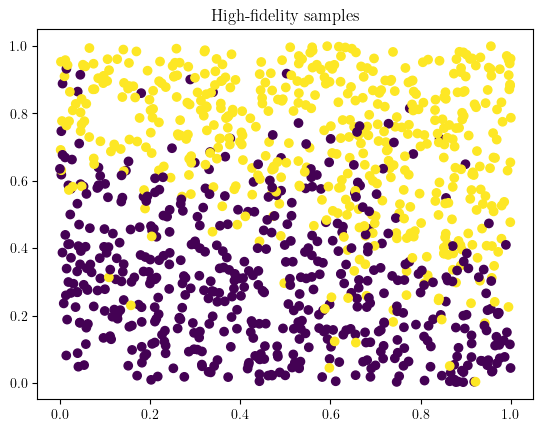

In [4]:
# The same as above but for high fidelity

def sample_bernoulli_outcome_high_fidelity() -> np.ndarray:
    xs = np.random.uniform(0, 1, size=(1000, 2))
    outcomes = []
    
    for x in xs:
        outcomes.append(np.random.binomial(1, high_fidelity_latent_function(x)))
        
    return xs, outcomes

xs, outcomes = sample_bernoulli_outcome_high_fidelity()

# Plot the samples
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(xs[:, 0], xs[:, 1], c=outcomes, cmap='viridis')
ax.set_title('High-fidelity samples')
plt.show()

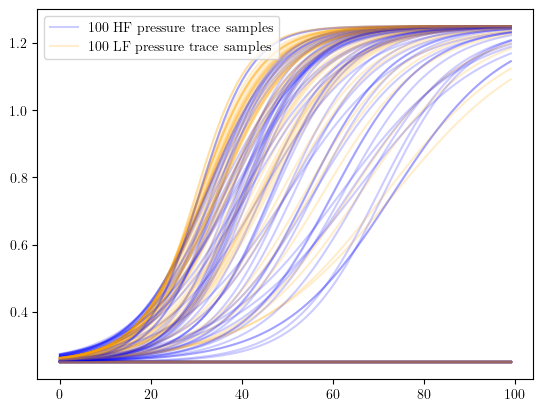

In [5]:
# We also need to be able to synthesize pressure traces

def sigmoid(t, t0, k):
    return 1 / (1 + np.exp(- k * (t - t0)) ) + 0.25 

def synthesize_hf_pressure_trace(ignition: bool, x: np.ndarray, latent_val: float):
    time_points = np.linspace(0, 1, 100)
    if not ignition:
        return pressure_noise_magnitude * np.random.randn(100) + 0.25 # Flat line
    else:
        # Sigmoidal rise, varying the slope and the delay time
        n_hat = np.array([1, 1])
        plane_val = 10.0 * np.dot(n_hat, x)
        return sigmoid(time_points, 0.8 - 0.5 * latent_val, plane_val) + pressure_noise_magnitude * np.random.randn(100)

def synthesize_lf_pressure_trace(ignition: bool, x: np.ndarray, latent_val: float):
    time_points = np.linspace(0, 1, 100)
    if not ignition:
        return pressure_noise_magnitude * np.random.randn(100) + 0.25 # Flat line
    else:
        # Sigmoidal rise, varying the slope and the delay time
        n_hat = np.array([1, 1])
        plane_val = 10.0 * np.dot(n_hat, x)
        return sigmoid(time_points, 0.8 - 0.5 * latent_val, plane_val) + pressure_noise_magnitude * np.random.randn(100)


def synthesize_hf_outcomes_and_pressures(xs, hf_latents):
    hf_outcomes = [np.random.binomial(1, f) for f in hf_latents]
    hf_pressure_traces = np.array([synthesize_hf_pressure_trace(ignition, x, f) for ignition, x, f in zip(hf_outcomes, xs, hf_latents)])
    return hf_outcomes, hf_pressure_traces


def synthesize_lf_outcomes_and_pressures(xs, lf_latents):
    lf_outcomes = [np.random.binomial(1, f) for f in lf_latents]
    lf_pressure_traces = np.array([synthesize_lf_pressure_trace(ignition, x, f) for ignition, x, f in zip(lf_outcomes, xs, lf_latents)])
    return lf_outcomes, lf_pressure_traces


xs = np.random.uniform(0, 1, size=(N, 2))
hf_latents = [high_fidelity_latent_function(x) for x in xs]
lf_latents = [low_fidelity_latent_function(x) for x in xs]
hf_outcomes, hf_pressure_traces = synthesize_hf_outcomes_and_pressures(xs, hf_latents)
lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)


# Visualise all pressure traces
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(lf_pressure_traces)):
    ax.plot(hf_pressure_traces[i, :], c='blue', alpha=0.2)
    ax.plot(lf_pressure_traces[i, :], c='orange', alpha=0.2)
    
for i in range(1):
    ax.plot(hf_pressure_traces[i, :], c='blue', alpha=0.2, label='100 HF pressure trace samples')
    ax.plot(lf_pressure_traces[i, :], c='orange', alpha=0.2, label='100 LF pressure trace samples')
ax.legend()
plt.show()

# 2. Conditional surrogate model of LF

We need a surrogate model for the LF pressure traces, conditional on successful ignition. A simple and reasonable choice is k-NN regression.

In [6]:
model_lf_ignition = KNeighborsRegressor(n_neighbors=1)

ignition_mask = np.array(lf_outcomes) == 1
X = xs[ignition_mask]
y = lf_pressure_traces[ignition_mask]

model_lf_ignition.fit(X, y)

KNeighborsRegressor(n_neighbors=1)

# 3. Evaluate standard ID using a fixed basis set

Next up, we want to evaluate the performance of standard ID using a fixed basis set. The evaluation is performed by repeatedly sampling a LF and a HF dataset, computing the ID weights using the LF dataset, then reconstructing the non-basis HF pressure traces using the HF basis plus the ID weights, and then calculating the error between the true vs. reconstructed HF pressure traces. This process is repeated until the average error stabilises. Note that the choice of basis coordinates is fixed at the beginning- we are sampling pressure traces from fixed coordinates by sampling from a Bernoulli distribution to determine ignition.

In [97]:
# Choose interpolation weights using ID

A = lf_pressure_traces.T  # (100, N)

k, idx, proj = sli.interp_decomp(A, 0.05)  # idx is a column index array

print(k, proj.shape)

B = A[:, idx[:k]]  # Skeleton matrix (100, 4)
C = A[:, idx[k:]]  # Non - skeleton matrix (100, 996)

approx_C = np.matmul(B, proj)

assert np.mean(C - approx_C) < 1e-2
assert k == 4

4 (4, 96)


In [98]:
np.array(lf_outcomes)[idx[:k]]

array([1, 1, 1, 0])

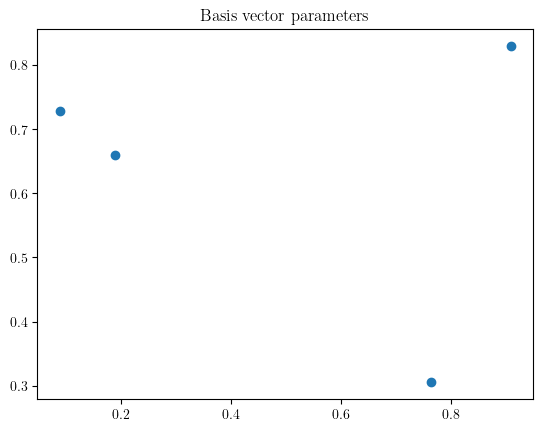

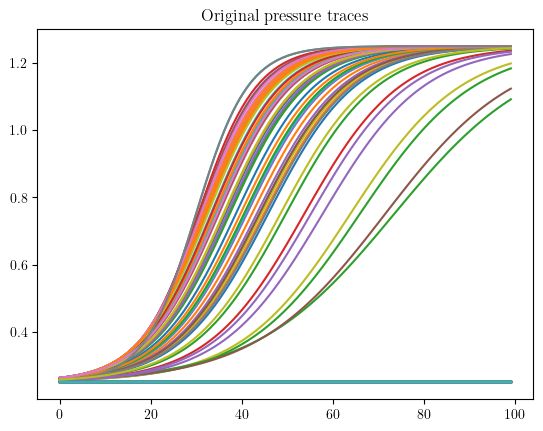

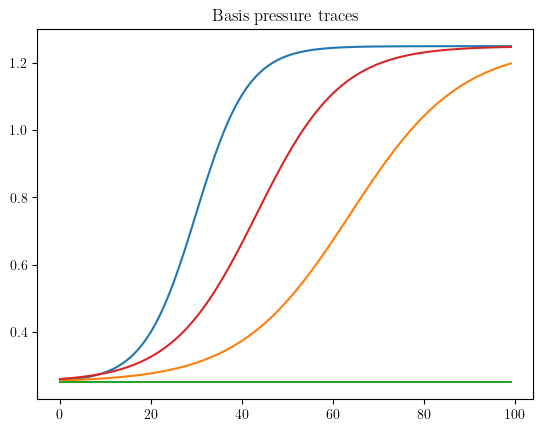

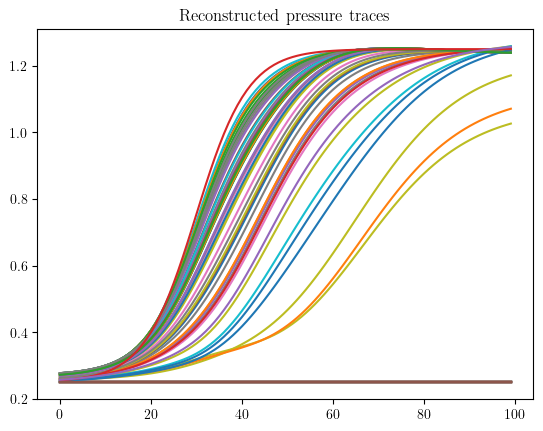

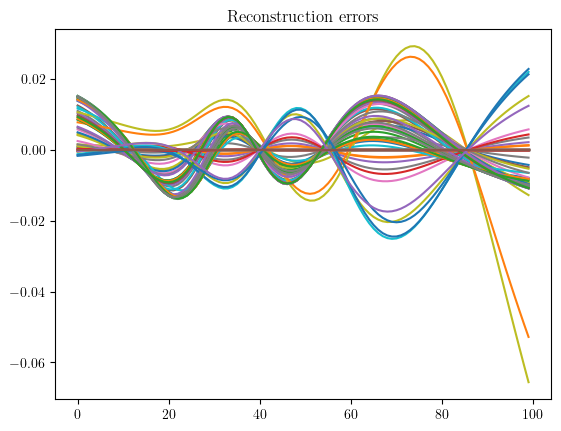

In [18]:
# Show position of basis in param space and reconstruction of LF dataset

basis_xs = xs[idx[:k], :]
non_basis_xs = xs[idx[k:], :]

plt.scatter(basis_xs[:, 0], basis_xs[:, 1])
#plt.scatter(non_basis_xs[:, 0], non_basis_xs[:, 1])
#plt.xlim(0, 1)
#plt.ylim(0, 1)
plt.title('Basis vector parameters')
plt.show()

plt.title('Original pressure traces')
plt.plot(A)
plt.show()

plt.title('Basis pressure traces')
plt.plot(B)
plt.show()

plt.title('Reconstructed pressure traces')
plt.plot(approx_C)
plt.show()

plt.title('Reconstruction errors')
plt.plot(approx_C - C)
plt.show()

In [19]:
# Define least squares problem for calculating a particular set of interpolation weights, given: 
# - data matrix of basis pressure traces B
# - non-basis traces C

def calculate_interpolation_weights(B, C):
    assert B.shape == (100, k)
    assert C.shape == (100, N - k)
    proj_shape = (k, N - k)
    
    def objective_fn(p):
        p = p.reshape(proj_shape)
        f = 0.5 * np.sum((B.dot(p) - C)**2)
        return f
    
    def gradient_fn(p):
        p = p.reshape(proj_shape)
        return B.T.dot(B.dot(p) - C).flatten()

    x0 = np.random.rand(np.prod(proj_shape))
    res = minimize(objective_fn, x0, jac=gradient_fn, method='BFGS', options={'disp': False, 'maxiter': 50})

    assert res.success
    proj_min = res.x

    return proj_min


def calculate_interpolation_weights_qr(B, C):
    assert B.shape == (100, k)
    assert C.shape == (100, N - k)
    proj_shape = (k, N - k)
    
    # QR decomposition of B
    Q, R = np.linalg.qr(B)
    
    # Compute Q^T * C
    Q_T_C = np.dot(Q.T, C)
    
    # Solve R * p = Q^T * C for p using only the first k rows of R and Q^T * C
    # Since R is an upper triangular matrix of shape (k, k) after QR decomposition of B
    p = np.linalg.solve(R[:k, :k], Q_T_C[:k, :])
    
    return p.flatten()


# Sample the HF non-basis reconstruction error

def sample_hf_reconstruction_error_standardID():
    hf_outcomes, hf_pressure_traces = synthesize_hf_outcomes_and_pressures(xs, hf_latents)
    lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)

    A_lf = lf_pressure_traces.T  # (100, N)
    B_lf = A_lf[:, idx[:k]]  # Skeleton matrix (100, 4)
    C_lf = A_lf[:, idx[k:]]  # Non - skeleton matrix (100, N - 4)
    
    proj = calculate_interpolation_weights(B_lf, C_lf)
    
    #proj = calculate_interpolation_weights_qr(B_lf, C_lf)
    
    proj = proj.reshape(k, N - k)

    A_hf = hf_pressure_traces.T
    B_hf = A_hf[:, idx[:k]]
    C_hf = A_hf[:, idx[k:]]

    C_recon = np.matmul(B_hf, proj)

    # Return the average L2 error norm of each reconstruction
    C_err = C_recon - C_hf
    all_err_norms = np.linalg.norm(C_err, axis=0)
    assert all_err_norms.shape == (N - k,)

    hf_basis_outcomes = np.array(hf_outcomes)[idx[:k]]
    lf_basis_outcomes = np.array(lf_outcomes)[idx[:k]]
    all_bases_match = np.all(hf_basis_outcomes == lf_basis_outcomes)

    return np.mean(all_err_norms), all_bases_match

In [20]:
# Repeatedly sample reconstruction errors for standard ID (with fixed basis)

def measure_errors(error_sample_fn, num_samples = 50):
    errors = []
    matching_basis = []

    i = 0
    
    while i < num_samples:
        err, match = error_sample_fn()
        errors.append(err)
        matching_basis.append(match)
        i += 1

    return errors, matching_basis


errors_standard, matching_basis_std = measure_errors(sample_hf_reconstruction_error_standardID, 500)

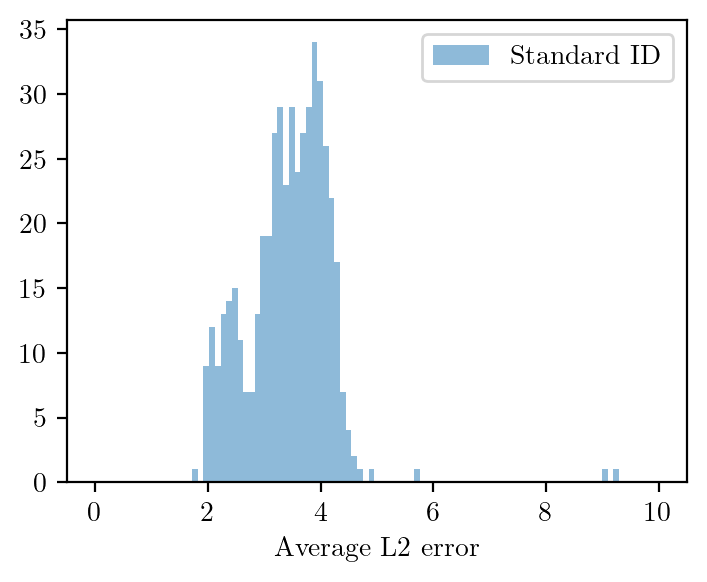

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=200)
ax.hist(errors_standard, bins=np.linspace(0, 10, 100), label="Standard ID", alpha=0.5)
ax.legend()
ax.set_xlabel("Average L2 error")

plt.show()

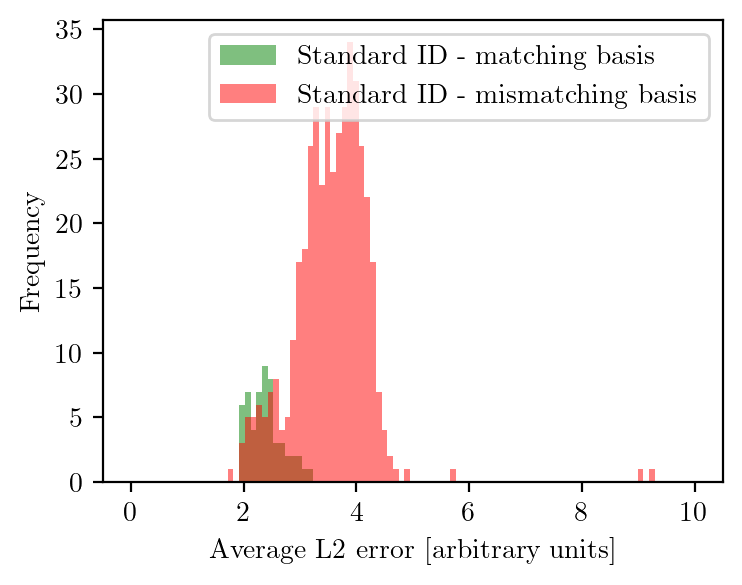

In [29]:
# We also want to see the relationship between mismatching basis fates, and errors

errors_standard_agree = np.array(errors_standard)[np.array(matching_basis_std)]
errors_standard_disagree = np.array(errors_standard)[~np.array(matching_basis_std)]

fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=200)
ax.hist(errors_standard_agree, bins=np.linspace(0, 10, 100), label="Standard ID - matching basis", color='green', alpha=0.5)
ax.hist(errors_standard_disagree, bins=np.linspace(0, 10, 100), label="Standard ID - mismatching basis", color='red', alpha=0.5)
ax.legend()
ax.set_xlabel("Average L2 error [arbitrary units]")
ax.set_ylabel("Frequency")

plt.show()

# 4. Store weights for all possible basis fates

This is the offline step. For each possible set of basis ignition fates (there are 2^num_basis possibilities), sample the LF data, then compute and store the projection matrix.

In [30]:
def sample_conditional_lf_pressure_trace_proj(ignition_fates):
    assert len(ignition_fates) == k

    _, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)
    A = lf_pressure_traces.T

    # First sample the non-basis pressure traces, and throw away the basis pressure traces since they are unconditional on ignition fate
    # This is fine, because the pressure trace at each x is independent of each other
    C = A[:, idx[k:]]  # (100, N - k)

    basis_lf_latents = [low_fidelity_latent_function(x) for x in basis_xs]

    assert len(basis_xs) == len(ignition_fates)
    assert len(basis_lf_latents) == len(basis_xs)

    # Next, sample the basis pressure traces for the given ignition fates
    basis_lf_pressure_trace_samples = [synthesize_lf_pressure_trace(ignition, x, f) for ignition, x, f in zip(ignition_fates, basis_xs, basis_lf_latents)]
    B = np.array(basis_lf_pressure_trace_samples).T  # (100, k)

    assert B.shape == (100, k)
    assert C.shape == (100, N - k)

    #proj = calculate_interpolation_weights_qr(B, C)
    proj = calculate_interpolation_weights(B, C)

    # Debug
    #C_pred = np.dot(B, proj.reshape(k, N - k))
    #plt.plot(C_pred, c='b', alpha=0.1)
    #plt.plot(C, c='r', alpha=0.1)
    #plt.show()

    return proj

    
def get_ignition_fates(k):
    from itertools import chain, combinations

    def powerset(iterable):
        s = list(iterable)
        return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))

    inds = list(powerset(range(k)))

    all_fates = []

    for ind in inds:
        fate = np.zeros(shape=(k,), dtype=bool)
        fate[list(ind)] = True
        all_fates.append(tuple(fate))

    assert len(all_fates) == 2**k

    return all_fates

all_fates = get_ignition_fates(k)
fate_to_projs = defaultdict(list)

n_samples_per_fate = 500

for fate in all_fates:
    print(fate)
        
    for _ in range(n_samples_per_fate):
        fate_to_projs[fate].append(sample_conditional_lf_pressure_trace_proj(fate))

(False, False, False, False)
(True, False, False, False)
(False, True, False, False)
(False, False, True, False)
(False, False, False, True)
(True, True, False, False)
(True, False, True, False)
(True, False, False, True)
(False, True, True, False)
(False, True, False, True)
(False, False, True, True)
(True, True, True, False)
(True, True, False, True)
(True, False, True, True)
(False, True, True, True)
(True, True, True, True)


# 5. Assess conditional ID error

In this case, we want to repeatedly sample HF data matrices, and then reconstruct them using weights which are conditioned on the fate of the basis vectors.

We randomly choose a weight matrix from the empirically-computed distribution.

In [31]:
def sample_hf_reconstruction_error_probID():
    hf_outcomes, hf_pressure_traces = synthesize_hf_outcomes_and_pressures(xs, hf_latents)
    #lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)

    basis_fates = tuple(np.array(hf_outcomes).astype(bool)[idx[:k]])

    # print(basis_fates)

    projs = fate_to_projs[basis_fates]

    proj = projs[np.random.choice(len(projs))]  # Randomly choose a proj matrix given ignition conditioning
    proj = proj.reshape(k, N - k)

    A_hf = hf_pressure_traces.T
    B_hf = A_hf[:, idx[:k]]  # (100, 4)
    C_hf = A_hf[:, idx[k:]]

    C_recon = np.matmul(B_hf, proj)

    # Return the average L2 error norm of each reconstruction
    C_err = C_recon - C_hf
    all_err_norms = np.linalg.norm(C_err, axis=0)
    assert all_err_norms.shape == (N - k,)

    return np.mean(all_err_norms), None

errors_prob, matches = measure_errors(sample_hf_reconstruction_error_probID, 500)

print(len(errors_prob))
print(len(errors_standard))

500
500


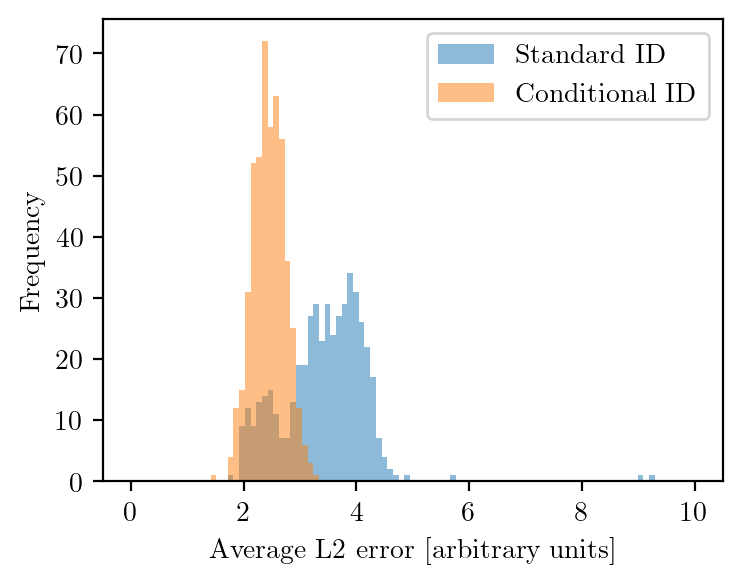

In [35]:

fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=200)
ax.hist(errors_standard, bins=np.linspace(0, 10, 100), label="Standard ID", alpha=0.5)
ax.hist(errors_prob, bins=np.linspace(0, 10, 100), label="Conditional ID", alpha=0.5)
ax.legend()
ax.set_xlabel("Average L2 error [arbitrary units]")
ax.set_ylabel("Frequency")

plt.show()

[0.9744877  0.51421826]
[0.92997513 0.12977466]
[0.68078667 0.27969072]
[0.67193752 0.6961974 ]
[0.24370917 0.1864456 ]
[0.46007469 0.30520591]
[0.28232713 0.75197882]
[0.23346387 0.81348244]
[0.43012484 0.35902094]


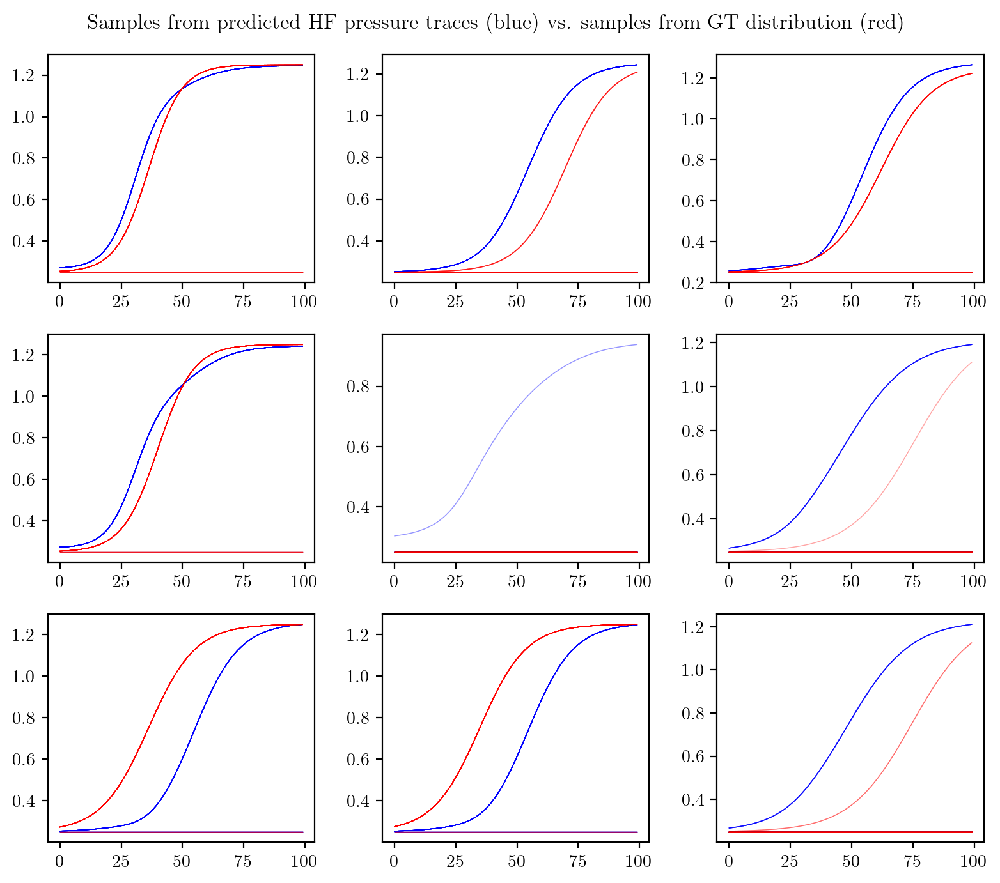

In [38]:
# TODO: look at the predictive distribution for one single reconstructed HF

ignition = (True, True, False, True)
projs = fate_to_projs[ignition]

basis_hf_latents = [high_fidelity_latent_function(x) for x in basis_xs]
basis_hf_pressure_trace_samples = [synthesize_hf_pressure_trace(ig, x, f) for ig, x, f in zip(ignition, basis_xs, basis_hf_latents)]
B = np.array(basis_hf_pressure_trace_samples).T

def draw_pred_and_gt_Cs(i):
    num_samples = 100
    
    pred_Cs = [np.dot(B, p.reshape(k, N - k)[:, i]) for p in projs[:num_samples]]
    
    
    x = non_basis_xs[i]
    print(x)
    gt_latent = high_fidelity_latent_function(x)
    gt_outcomes = [sample_bernoulli_outcome(x) for _ in range(num_samples)]
    gt_Cs = [synthesize_hf_pressure_trace(ignition, x, gt_latent) for ignition in gt_outcomes]

    return pred_Cs, gt_Cs



fig, axs = plt.subplots(3, 3, figsize=(8, 7), dpi=200)
for i, ax in enumerate(axs.flatten()):
    pred_Cs, gt_Cs = draw_pred_and_gt_Cs(i)
    
    for c in pred_Cs:
        ax.plot(c, c='b', alpha=0.1, linewidth=0.5)
    for p in gt_Cs:
        ax.plot(p, c='r', alpha=0.1, linewidth=0.5)

fig.suptitle('Samples from predicted HF pressure traces (blue) vs. samples from GT distribution (red)')
fig.tight_layout()
plt.show()

# 6. Test if the random proj matrices can be modelled as MVN

(False, False, False, False)


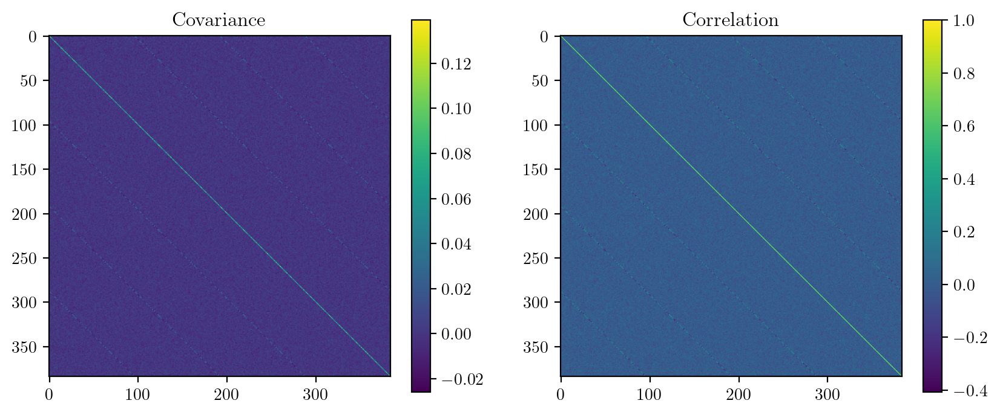

True


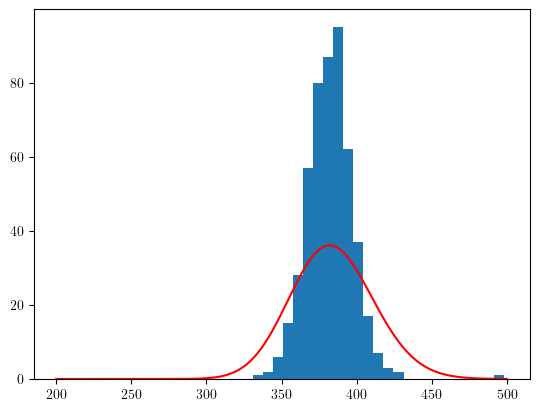

(True, False, False, False)


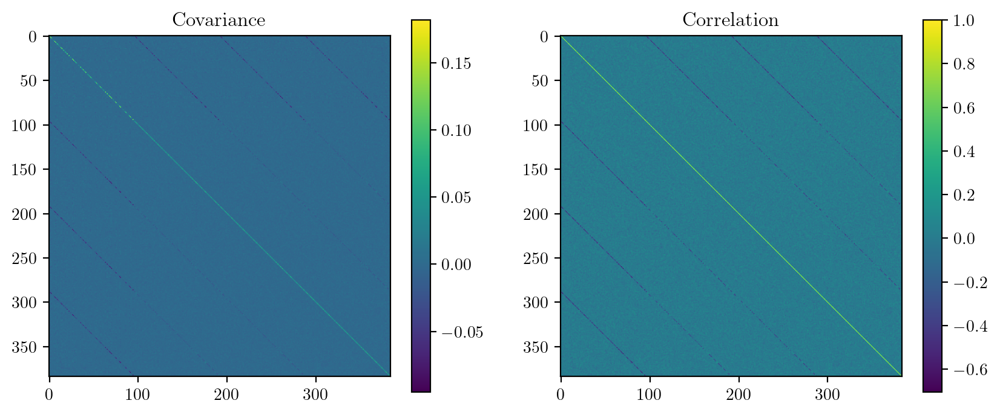

True


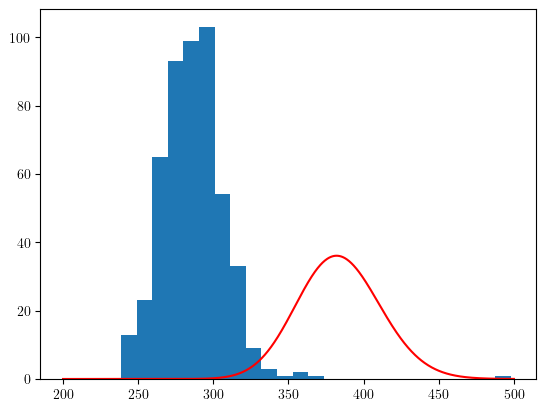

(False, True, False, False)


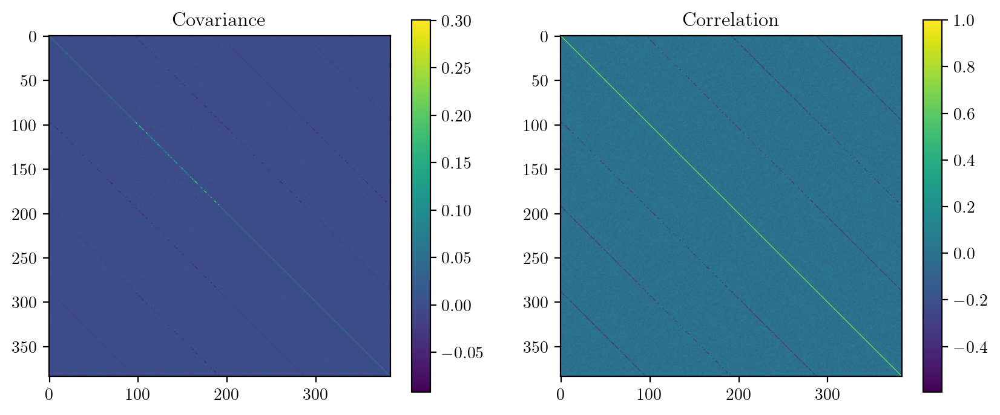

True


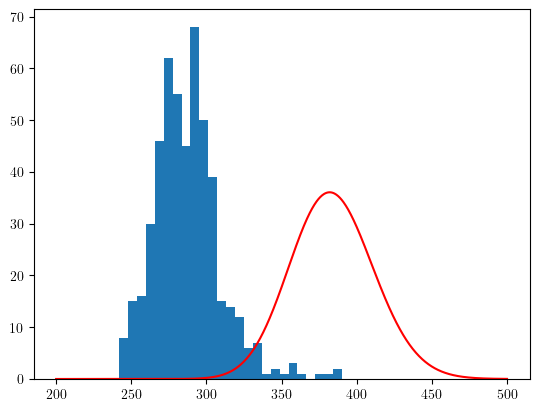

(False, False, True, False)


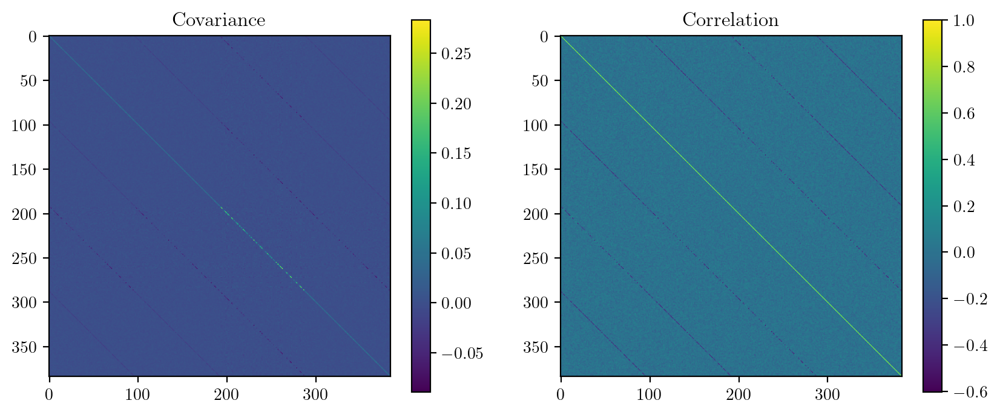

True


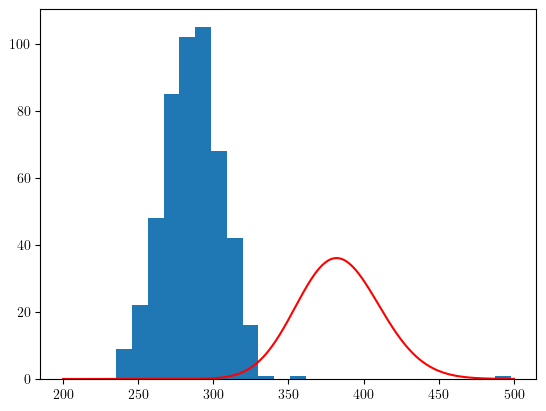

(False, False, False, True)


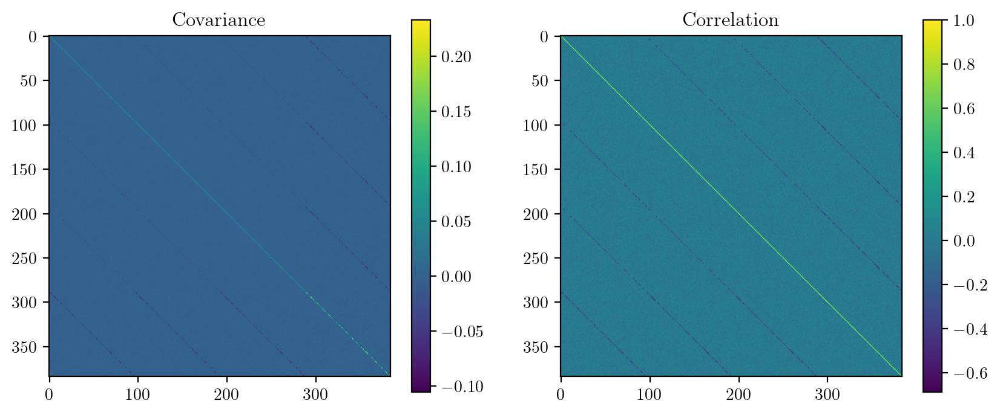

True


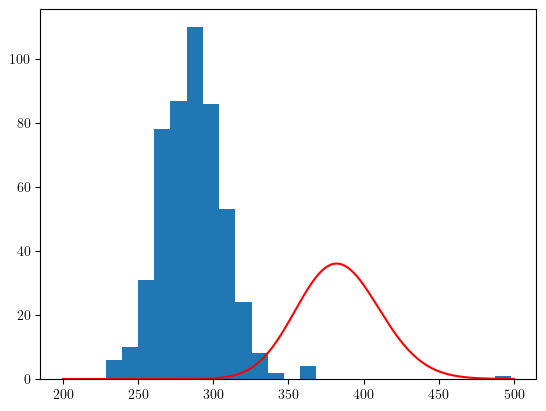

(True, True, False, False)


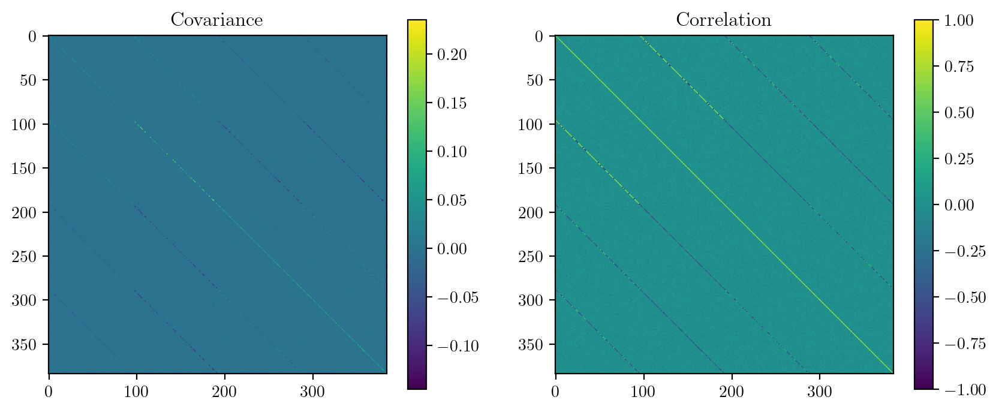

True


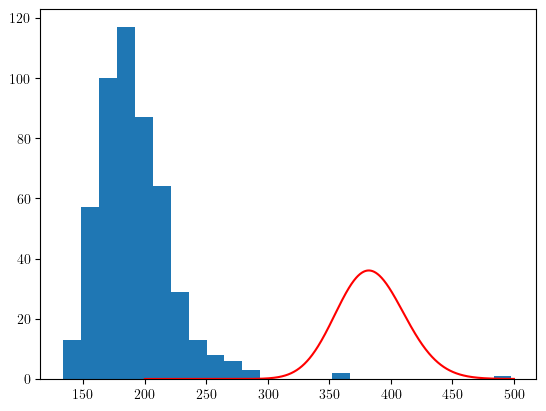

(True, False, True, False)


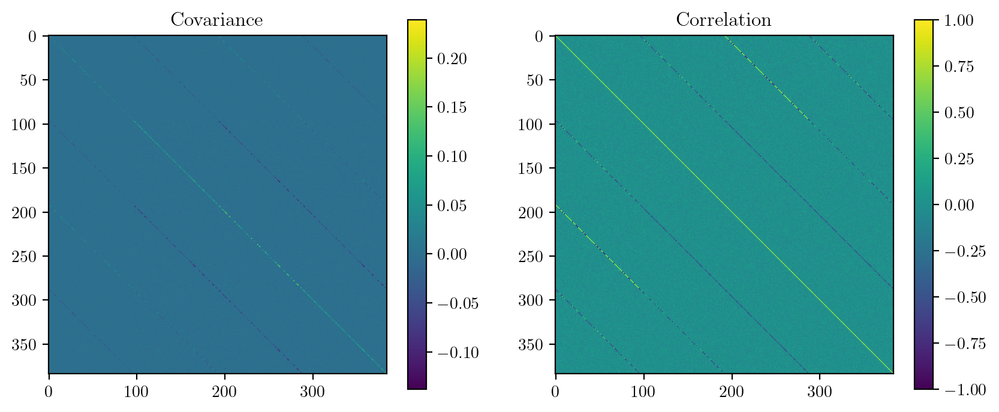

True


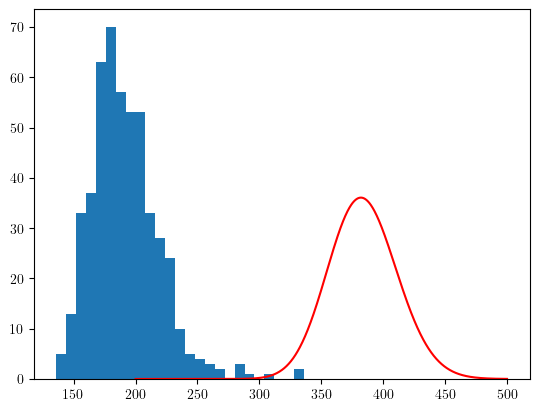

(True, False, False, True)


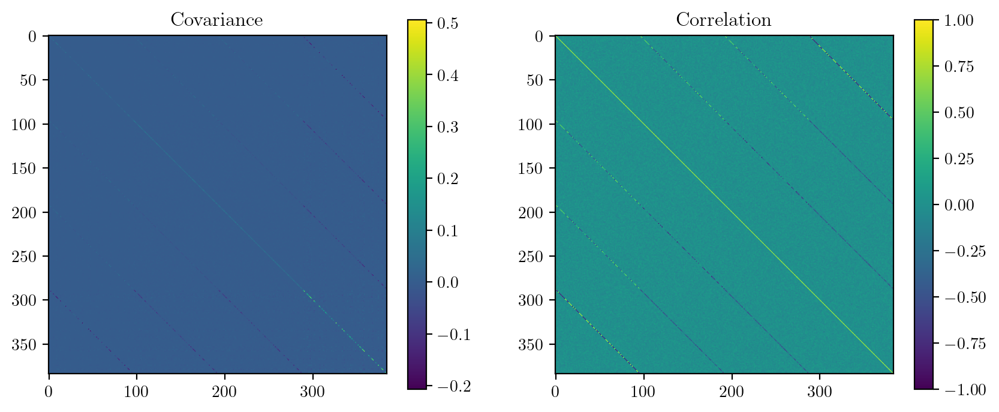

True


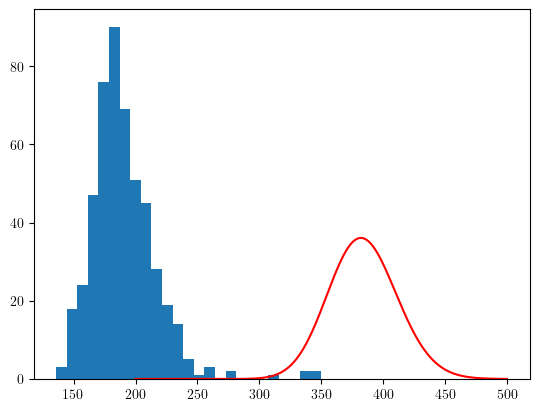

(False, True, True, False)


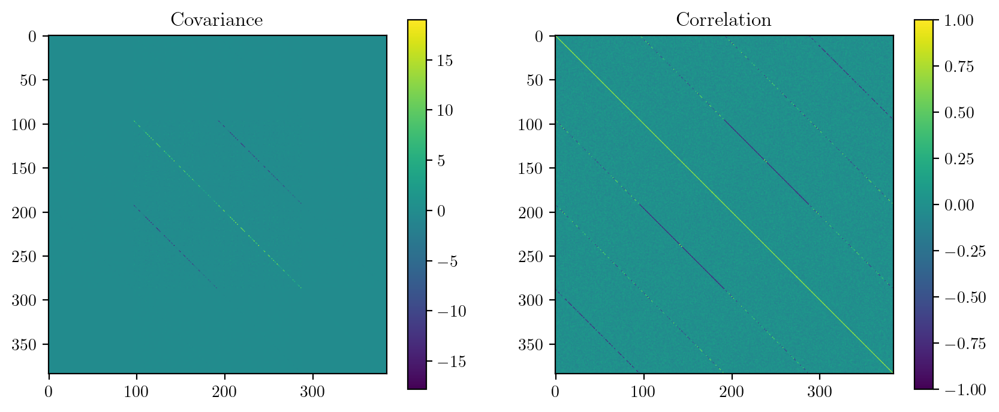

True


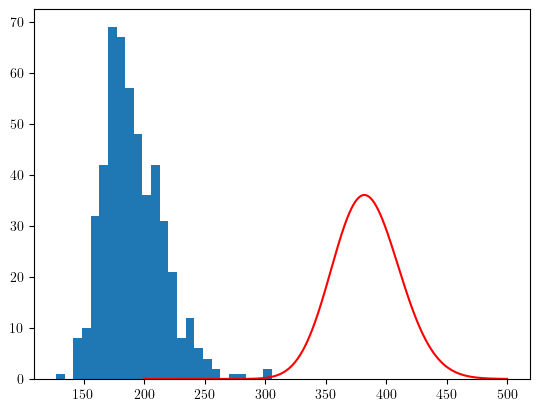

(False, True, False, True)


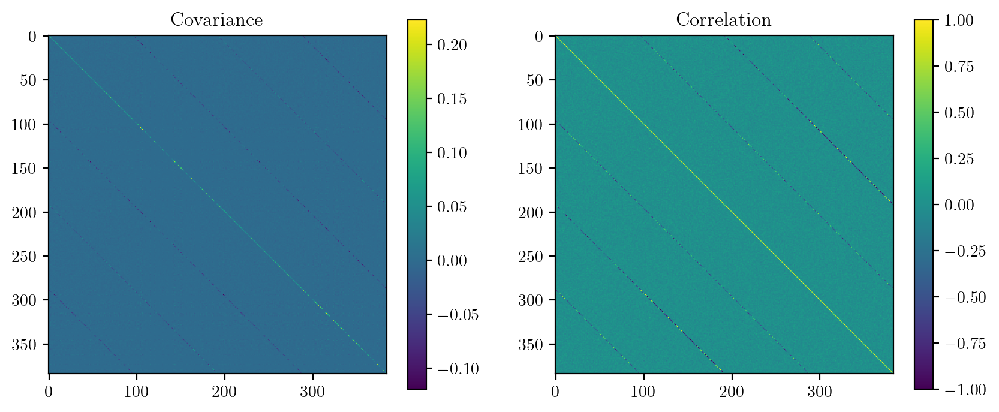

True


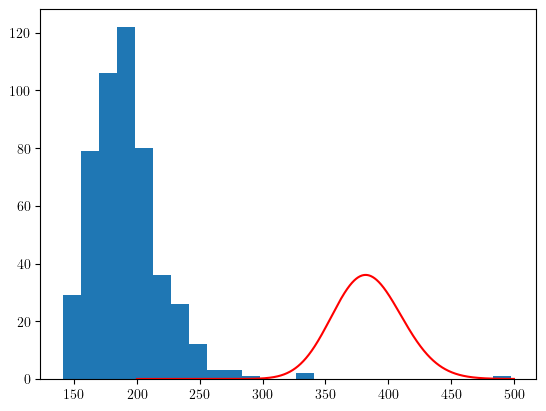

(False, False, True, True)


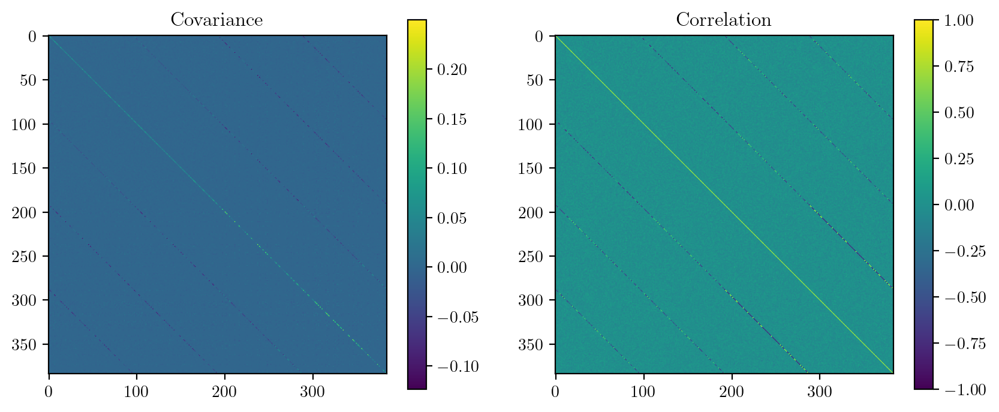

True


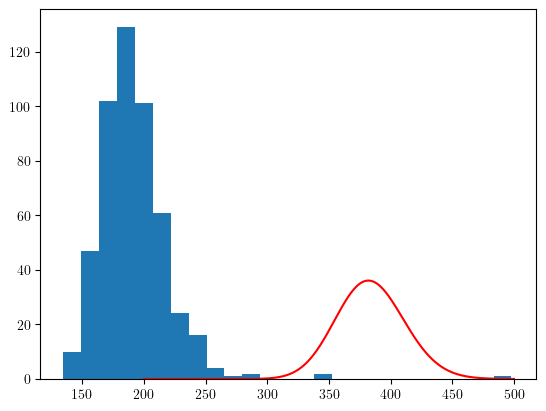

(True, True, True, False)


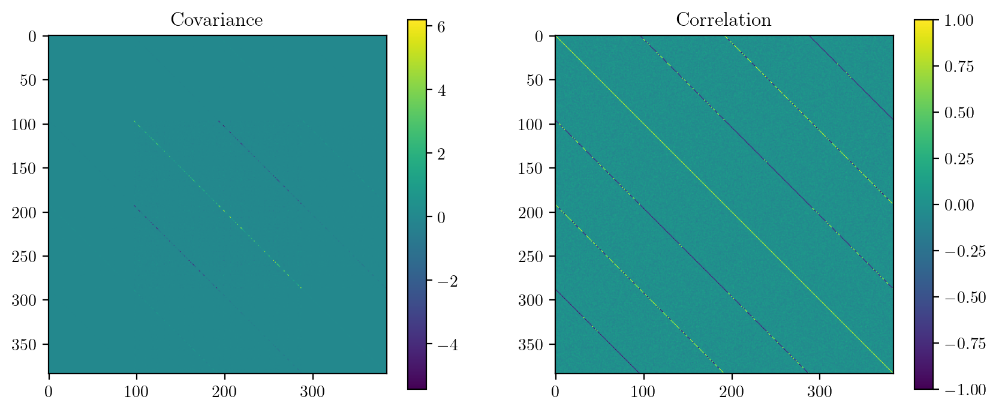

True


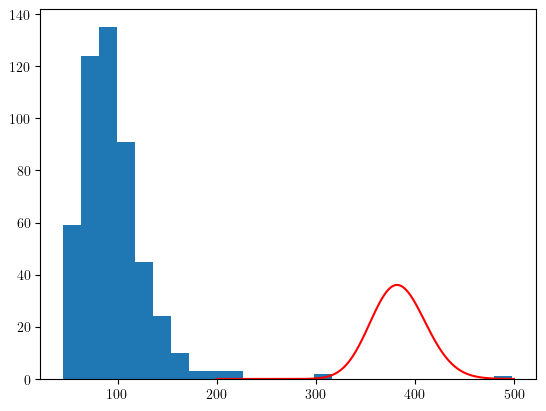

(True, True, False, True)


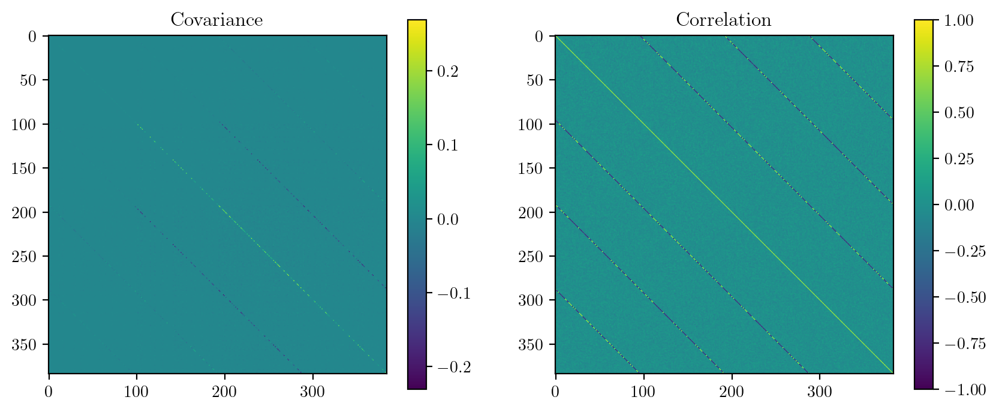

True


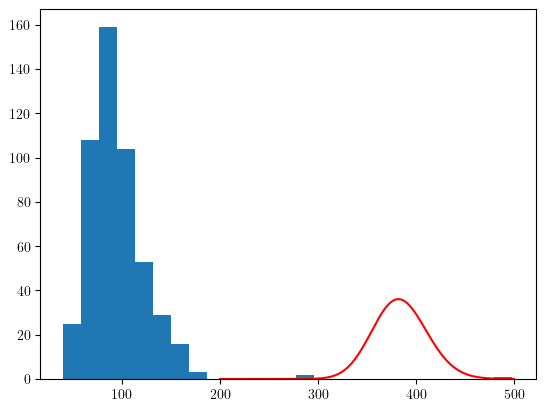

(True, False, True, True)


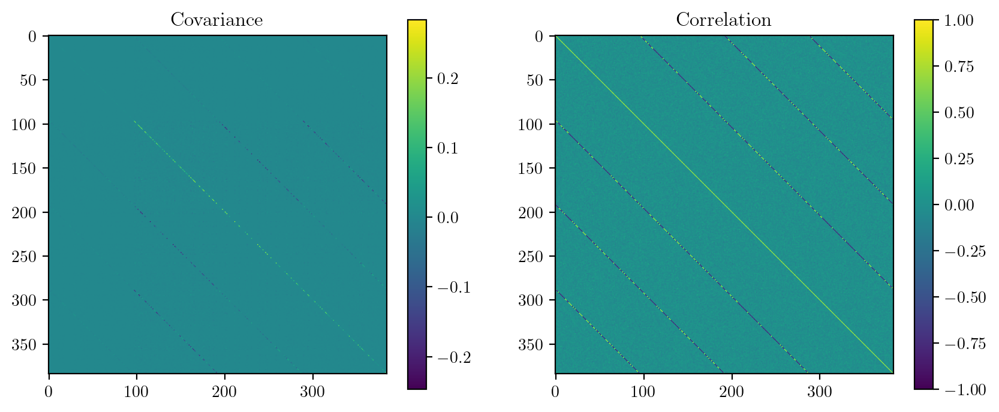

True


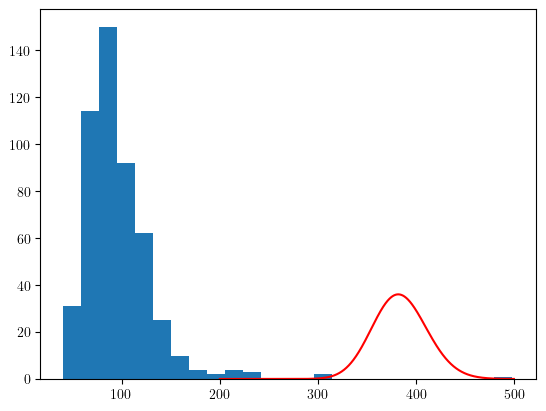

(False, True, True, True)


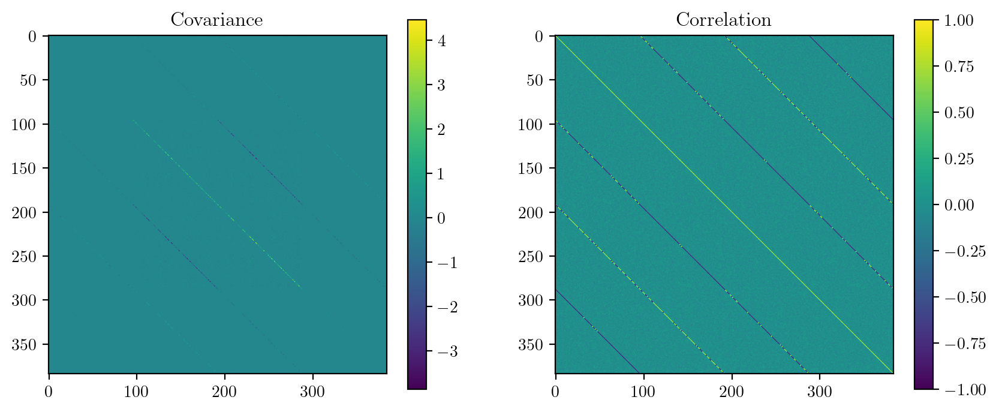

True


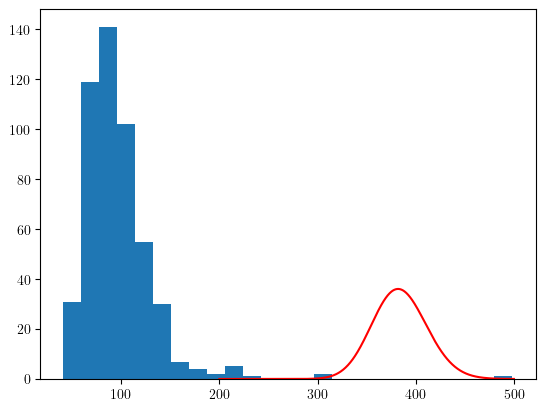

(True, True, True, True)


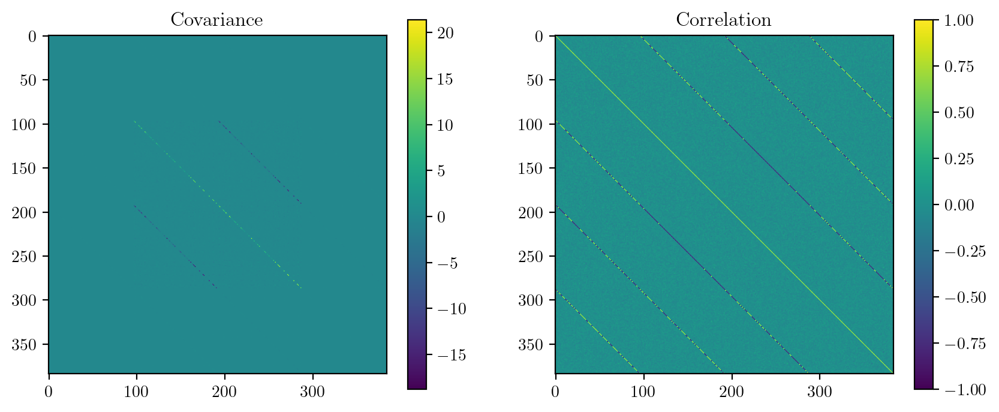

True


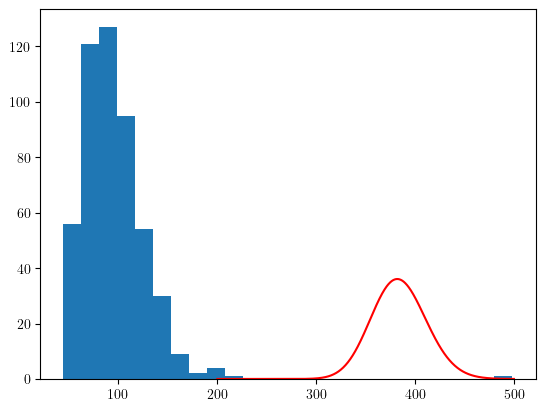

In [39]:
fate_to_plot_args = {}

for fate in fate_to_projs:
    print(fate)
    
    proj = fate_to_projs[fate]

    M = np.array(proj).T  # (384, num_samples)
    corr = np.corrcoef(M)
    cov = np.cov(M)
    dof = M.shape[0]
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=200)
    im = axs[0].imshow(cov)
    fig.colorbar(im, ax=axs[0])
    axs[0].set_title('Covariance')
    
    im = axs[1].imshow(corr)
    fig.colorbar(im, ax=axs[1])
    axs[1].set_title('Correlation')
    
    plt.show()

    cov = cov + np.eye(cov.shape[0]) * 1e-9  # We need to add this to keep cov positive definite
    
    eigvals = np.linalg.eigvals(cov)
    print(np.all(eigvals > 0))
    
    inv_cov = np.linalg.inv(cov)
    mu = np.mean(M, axis=-1)

    x_minus_mu = (M - mu[:, None])  # (384, ns) each column is a zero-mean sample
    
    distances = []
    
    for i in range(x_minus_mu.shape[1]):
        x = x_minus_mu[:, i]
        d_sq = np.dot(x.T, np.matmul(inv_cov, x))
        distances.append(d_sq)  # Compute all squared Mahalanobis distances
    
    
    # dist_sq = np.diag(np.dot(x_minus_mu.T, np.matmul(inv_cov, x_minus_mu)))  # Shape (100) since we have 100 data observations
    dist_sq = np.array(distances)
    plt.hist(dist_sq, bins=25)
    
    cxs = np.linspace(200, 500, 1000)
    cvs = stats.chi2(dof).pdf(cxs)
    plt.plot(cxs, cvs * 2500, c='red')
    plt.show()

    dist_sq_sorted = np.sort(dist_sq)
    chi_values = stats.chi2.ppf((np.arange(1, len(dist_sq) + 1) - 0.5) / len(dist_sq), dof)

    fate_to_plot_args[fate] = (chi_values, dist_sq_sorted)
    



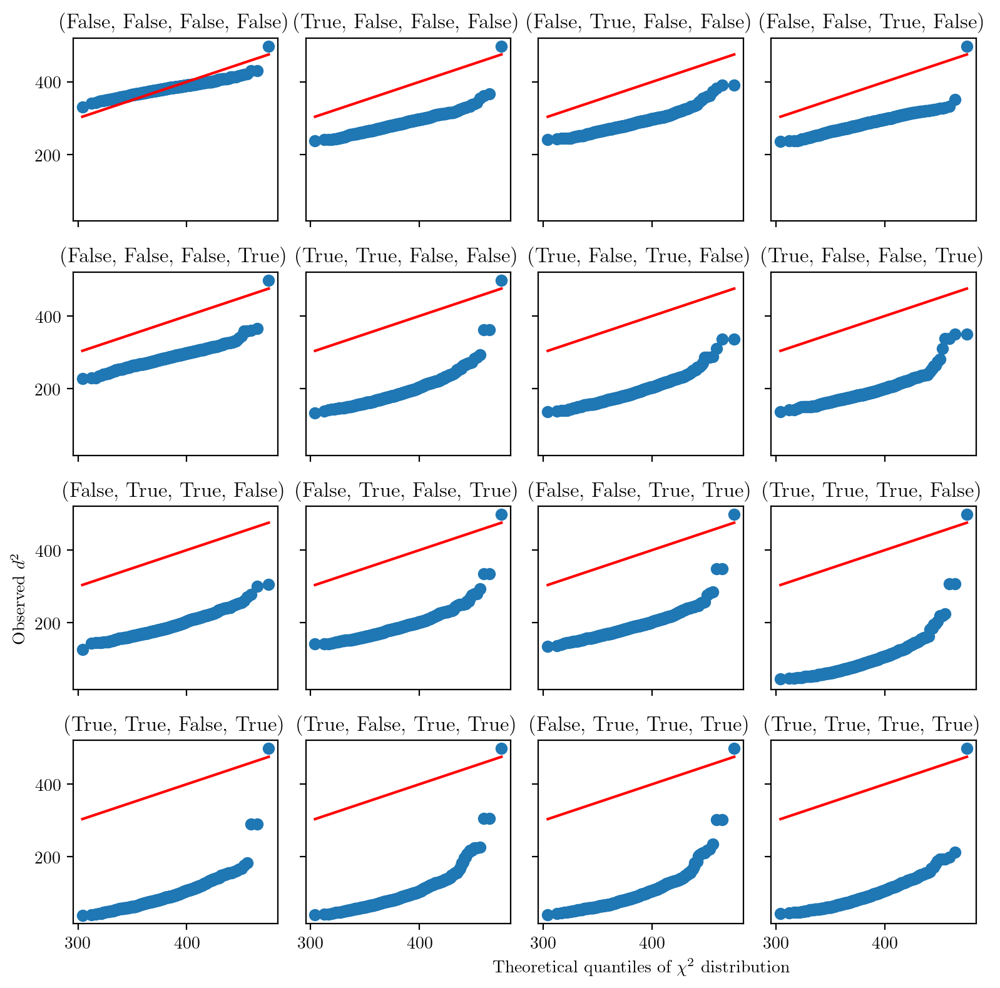

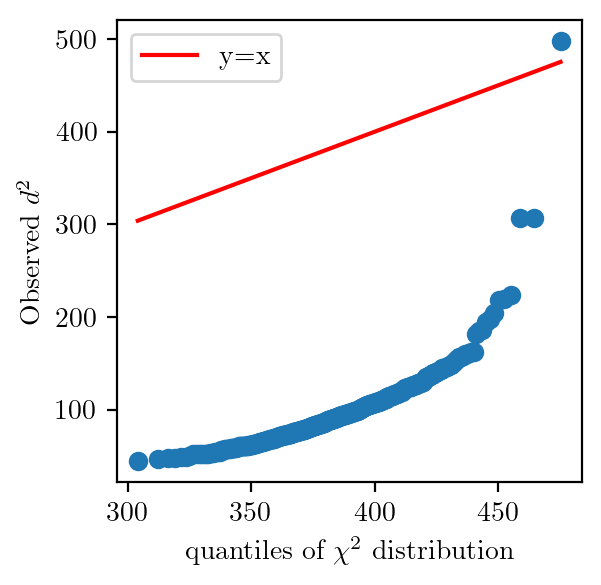

In [187]:
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(8, 8), dpi=200)

for i, k in enumerate(fate_to_plot_args):
    x, y = fate_to_plot_args[k]
    ax = axs.flatten()[i]

    ax.plot(x, y, 'o')
    ax.plot([min(x), max(x)], [min(x), max(x)], 'r-')
    ax.set_title(k)

axs[3, 2].set_xlabel('Theoretical quantiles of $\chi^2$ distribution')
axs[2, 0].set_ylabel('Observed $d^2$')
    
fig.tight_layout()
plt.show()


# Now just plot (TTTF)

x, y = fate_to_plot_args[(True, True, True, False)]
fig, ax = plt.subplots(1, 1, figsize=(3, 3), dpi=200)
ax.scatter(x, y)
ax.plot([min(x), max(x)], [min(x), max(x)], 'r-', label='y=x')
ax.set_xlabel('quantiles of $\chi^2$ distribution')
ax.set_ylabel('Observed $d^2$')
ax.legend()
plt.show()



# 7. Propose mixture model for data matrix, and then numerically optimise the LL, and then finally show QQ plot again to compare to samples

In [ ]:
# We need a couple of components for this to work. Firstly, we sample one set of ignition outcomes and pressure traces for LF data.
# We train a GPC on ignition outcomes
# Train a kNN-regressor on ignited pressure traces
# Train a kNN-regressor on non-ignited pressure traces
# Then, sample a large number of pressure traces at each position. Compute interpolation matrix for each round of samples.
# Show a final Q-Q plot comparing the original lambda (from toy dataset) with the lambda generated here

In [42]:
lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)

In [99]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

kernel = 1.0 * RBF(0.5)

gpc = GaussianProcessClassifier(kernel=kernel)
gpc.fit(xs, lf_outcomes)

GaussianProcessClassifier(kernel=1**2 * RBF(length_scale=0.5))

In [100]:
gpc.score(xs, lf_outcomes)

0.93

In [101]:
ignited_mask = np.argwhere(lf_outcomes)
non_ignited_mask = [i for i in range(len(lf_outcomes)) if lf_outcomes[i] == 0]
assert len(ignited_mask) + len(non_ignited_mask) == 100

from sklearn.neighbors import KNeighborsRegressor

ignited_xs = np.array([xs[i] for i in ignited_mask]).squeeze()
ignited_pressures = np.array([lf_pressure_traces[i] for i in ignited_mask]).squeeze()
ignited_model = KNeighborsRegressor(n_neighbors=1)
ignited_model.fit(ignited_xs, ignited_pressures)

non_ignited_xs = np.array([xs[i] for i in non_ignited_mask]).squeeze()
non_ignited_pressures = np.array([lf_pressure_traces[i] for i in non_ignited_mask]).squeeze()
non_ignited_model = KNeighborsRegressor(n_neighbors=1)
non_ignited_model.fit(non_ignited_xs, non_ignited_pressures)


KNeighborsRegressor(n_neighbors=1)

In [176]:
# Define function to sample a round of pressure traces

gen = np.random.default_rng(42)

def sample_single_pressure_trace(phi, mu, sigma, mu_0, sigma_0):
    ignition = gen.binomial(1, phi)

    if ignition:
        x = gen.multivariate_normal(mu, sigma * np.eye(len(mu)), size=1)
    else:
        x = gen.multivariate_normal(mu_0, sigma_0 * np.eye(len(mu_0)), size=1)

    return x.squeeze()



def sample_all_pressure_traces(xs):
    
    all_phi = gpc.predict_proba(xs)[:, 1]
    all_mu = ignited_model.predict(xs)
    all_mu_0 = non_ignited_model.predict(xs)

    sigma = 0.0001
    sigma_0 = 0.0001
    all_pressure_traces = [sample_single_pressure_trace(phi, mu, sigma, mu_0, sigma_0) for phi, mu, mu_0 in zip(all_phi, all_mu, all_mu_0)]
    return all_pressure_traces


def sample_interpolation_matrix(xs, N):
    all_lambda = []
    for i in range(N):
        all_p = np.array(sample_all_pressure_traces(xs))
        basis_p = all_p[idx[:k]]
        non_basis_p = all_p[idx[k:]]
        B = basis_p
        C = non_basis_p
        p = calculate_interpolation_weights_qr(B.T, C.T)
        all_lambda.append(p.flatten())
    return np.array(all_lambda)


In [177]:
all_lambda_parametric = sample_interpolation_matrix(xs, 100)

In [178]:
# Now sample from actual toy dataset

def sample_one_proj_from_true_data():
    lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)

    A_lf = lf_pressure_traces.T  # (100, N)
    B_lf = A_lf[:, idx[:k]]  # Skeleton matrix (100, 4)
    C_lf = A_lf[:, idx[k:]]  # Non - skeleton matrix (100, N - 4)
    
    proj = calculate_interpolation_weights(B_lf, C_lf)

    return proj.flatten()

all_lambda_true = np.array([sample_one_proj_from_true_data() for _ in range(100)])

all_lambda_true.shape

(100, 384)

In [179]:
# Finally compute d^2 for both samples, and produce a Q-Q plot

In [180]:
mu_param = np.mean(all_lambda_parametric, axis=0)
cov_param = np.cov(all_lambda_parametric.T) + np.eye(inv_cov_param.shape[0]) * 1e-6
inv_cov_param = np.linalg.inv(cov_param) 

eigvals = np.linalg.eigvals(cov_param)
print(np.all(eigvals > 0))

mu_true = np.mean(all_lambda_true, axis=0)
cov_true = np.cov(all_lambda_true.T) + np.eye(inv_cov_param.shape[0]) * 1e-6
inv_cov_true = np.linalg.inv(cov_true) 

eigvals = np.linalg.eigvals(cov_true)
print(np.all(eigvals > 0))

centred_samples_param = all_lambda_parametric - mu_param
centred_samples_true = all_lambda_true - mu_true
#d_sq_param = np.diag(np.dot(centred_samples_param, np.matmul(inv_cov_param, centred_samples_param.T)))
d_sq_true = np.diag(np.dot(centred_samples_true, np.matmul(inv_cov_true, centred_samples_true.T)))

distances_param = []
    
for i in range(centred_samples_param.shape[0]):
    x = centred_samples_param[i, :]
    d_sq = np.dot(x.T, np.matmul(inv_cov_param, x))
    distances_param.append(d_sq)  # Compute all squared Mahalanobis distances

d_sq_param = np.array(distances_param)
print(d_sq_param)

True
True
[98.00916035 98.00937668 98.00969444 98.00913417 98.00926388 98.00933007
 98.00981825 98.00981354 98.00918756 98.00933618 98.00894808 98.00849824
 98.00918546 98.00884756 98.00982206 98.00901178 98.00921184 98.00961144
 98.00878135 98.0093663  98.00940926 98.00943487 98.00933601 98.00936107
 98.00994992 98.0089018  98.00915246 98.00973141 98.0088796  98.00887028
 98.00927067 98.00937499 98.00902983 98.00844458 98.009609   98.00908762
 98.00982839 98.00946223 98.00915684 98.00891565 98.00953519 98.00995532
 98.0084798  98.00892112 98.00902034 98.00892972 98.00891382 98.00958431
 98.00928996 98.00964102 98.00914689 98.0084132  98.00886919 98.00886665
 98.0088034  98.00866201 98.00831615 98.00895666 98.00869363 98.00924834
 98.00888958 98.00964987 98.00853341 98.00943415 98.00919274 98.00912498
 98.00893066 98.00939106 98.0087255  98.00948888 98.00935701 98.00978192
 98.00977428 98.00930882 98.00947913 98.00919377 98.00932297 98.00887408
 98.00934928 98.00911101 98.00978303 98.0

In [181]:
mu_param.shape

(384,)

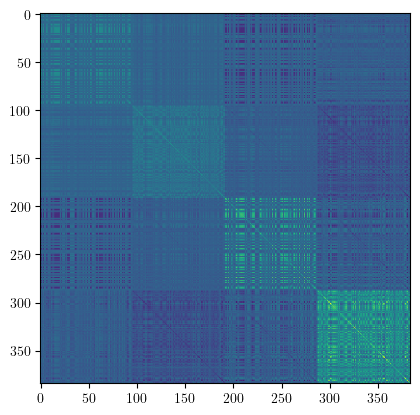

In [182]:
plt.imshow(cov_param)

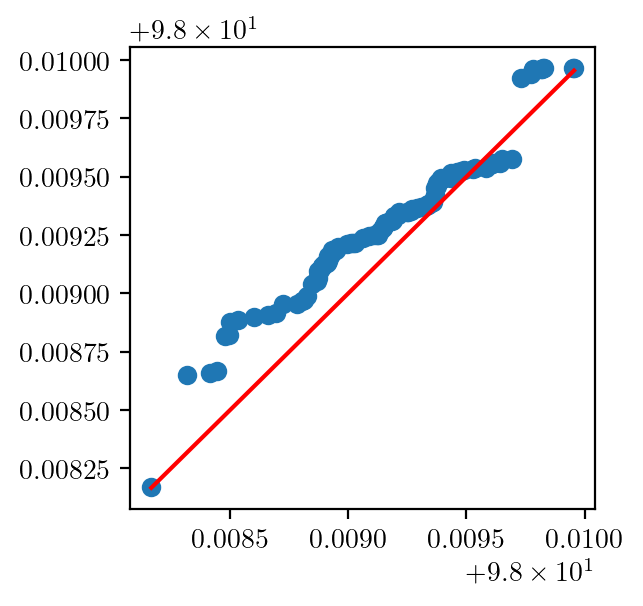

In [183]:
fig, ax = plt.subplots(1, 1, figsize=(3, 3), dpi=200)

x = np.sort(d_sq_param)
y = np.sort(d_sq_true)
ax.scatter(x, y)
ax.plot(x, x, c='red')

plt.show()

In [41]:
import numpy as np
from scipy.stats import t
from scipy.linalg import inv

def hotelling_t2_test(sample1, sample2):
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    p = sample1.shape[1]

    # Mean vectors
    mean1 = np.mean(sample1, axis=0)
    mean2 = np.mean(sample2, axis=0)

    # Covariance matrices
    cov1 = np.cov(sample1, rowvar=False)
    cov2 = np.cov(sample2, rowvar=False)

    # Pooled covariance matrix
    pooled_cov = ((n1 - 1) * cov1 + (n2 - 1) * cov2) / (n1 + n2 - 2)

    # Hotelling's T^2 statistic
    mean_diff = mean1 - mean2
    T2 = (n1 * n2) / (n1 + n2) * np.dot(np.dot(mean_diff.T, inv(pooled_cov)), mean_diff)

    # F-statistic
    F = (n1 + n2 - p - 1) * T2 / ((n1 + n2 - 2) * p)

    # Degrees of freedom
    df1 = p
    df2 = n1 + n2 - p - 1

    # P-value
    p_value = 1 - t.cdf(F, df1, df2)

    return T2, F, p_value

# Example usage
sample1 = np.random.rand(10, 3)  # Sample 1 with 10 observations and 3 variables
sample2 = np.random.rand(12, 3)  # Sample 2 with 12 observations and 3 variables

T2, F, p_value = hotelling_t2_test(sample1, sample2)
print(f"Hotelling's T^2: {T2}")
print(f"F-statistic: {F}")
print(f"P-value: {p_value}")


Hotelling's T^2: 0.7499620715263561
F-statistic: 0.22498862145790682
P-value: 0.9998058735655672
